In [10]:
import pandas as pd
import numpy as np
import requests
from datetime import datetime, timedelta
from dateutil.relativedelta import relativedelta
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style='darkgrid')
from sklearn.metrics import r2_score
from sklearn.cluster import KMeans
import statsmodels.api as sm
from colorama import Fore, Style
from scipy.optimize import fsolve, curve_fit
import yfinance as yf
import akshare as ak
import sys
sys.path.append('../src') 
from utils import plot_candlestick, get_optimum_clusters, exponential_func

from chinese_etf_strategy import etf_strategy, etf_regression
from chinese_commodity_strategy import commodity_strategy

## Some sample code that're working

In [2]:
# Tongxin ETF, changnei, history
etf_code = "sh515880"  # ETF代码
etf_hist = ak.fund_etf_hist_sina(symbol=etf_code)
etf_hist.tail()

,date,open,high,low,close,volume
1390,2025-06-09,1.310,1.340,1.309,1.328,193317746
1391,2025-06-10,1.316,1.322,1.293,1.309,184975109
1392,2025-06-11,1.307,1.323,1.305,1.307,114474878
1393,2025-06-12,1.301,1.353,1.298,1.334,193786413
1394,2025-06-13,1.321,1.343,1.315,1.322,135218781


In [3]:
# Tongxin ETF, changnei, realtime
df = ak.fund_etf_spot_ths()
df[df['基金代码']=='515880']

,序号,基金代码,基金名称,当前-单位净值,当前-累计净值,前一日-单位净值,前一日-累计净值,增长值,增长率,赎回状态,申购状态,最新-交易日,最新-单位净值,最新-累计净值,基金类型,查询日期
516,517,515880,国泰中证全指通信设备ETF,1.3221,1.3221,1.3314,1.3314,-0.0093,-0.7,开放,开放,2025-06-13,1.3221,1.3221,股票型,2025-06-13


In [10]:
# Tongxin ETF, changnei, lishi and shishi
etf_code = "515880"  # ETF代码
start_date = (datetime.today() - relativedelta(years=3)).strftime('%Y%m%d')   # 开始日期
end_date = datetime.today().strftime('%Y%m%d')  # 结束日期

etf_hist = ak.fund_etf_hist_em(symbol=etf_code, period="daily", start_date=start_date, end_date=end_date, adjust="")
etf_hist.rename(columns={"日期": 'date', "开盘": 'open', "收盘": 'close', "最高": 'high', "最低": 'low', "成交量": 'volume', "成交额": 'amount'}, inplace=True)
etf_hist.tail()

,date,open,close,high,low,volume,amount,振幅,涨跌幅,涨跌额,换手率
724,2025-06-09,1.310,1.328,1.340,1.309,1933177,255954987.0,2.38,1.76,0.023,8.87
725,2025-06-10,1.316,1.309,1.322,1.293,1849751,242038671.0,2.18,-1.43,-0.019,8.49
726,2025-06-11,1.307,1.307,1.323,1.305,1144749,150256596.0,1.38,-0.15,-0.002,5.25
727,2025-06-12,1.301,1.334,1.353,1.298,1937864,259053470.0,4.21,2.07,0.027,8.90
728,2025-06-13,1.321,1.322,1.343,1.315,1352188,179384742.0,2.10,-0.90,-0.012,6.21


In [21]:
# Huangjin, history
spot_hist_sge_df = ak.spot_hist_sge(symbol='Au99.99')
spot_hist_sge_df['date']= pd.to_datetime(spot_hist_sge_df['date'])
spot_hist_sge_df.tail()

,date,open,close,low,high
2063,2025-06-24,782.00,768.87,767.0,782.20
2064,2025-06-25,768.00,771.49,764.0,772.00
2065,2025-06-26,770.00,773.64,768.0,774.00
2066,2025-06-27,772.03,763.30,762.2,772.03
2067,2025-06-30,760.00,764.43,756.0,765.00


In [22]:
last_49day_price = spot_hist_sge_df['close'][-50:-1]
p_ma = np.mean(last_49day_price)
print('50MA break point:', round(p_ma,2))

50MA break point: 776.97


In [13]:
# Huangjin, realtime
spot_quotations_sge_df = ak.spot_quotations_sge(symbol="Au99.99")
spot_quotations_sge_df[spot_quotations_sge_df['时间'] == spot_quotations_sge_df['时间'].max()]

,品种,时间,现价,更新时间
239,Au99.99,23:59,795.0,2025年06月16日 02:24:55


In [14]:
spot_quotations_sge_df[spot_quotations_sge_df['时间'] == spot_quotations_sge_df['时间'].max()]['现价']

239    795.0
Name: 现价, dtype: float64

## ALL ETFs

* Current etf price: 0.73
* Recent high: 0.9
* Current etf price is at 81.61% of recent high
Latest 20 Day MA: 0.71
Latest lower Bollinger Band, 20MA: 0.7
Latest higher Bollinger Band, 20MA: 0.73
Latest 50 Day MA: 0.71
Latest lower Bollinger Band, 50MA: 0.67
Latest higher Bollinger Band, 50MA: 0.75
Latest 50 Day EMA: 0.72
Latest 120 Day MA: 0.73
Latest 200 Day MA: 0.73
Latest 200 Day EMA: 0.73

Latest RSI: 69.23 
Latest MACD Divergence: 0.0 
20MA crosses 50MA at 0.54
50MA crosses 200MA at 1.22
20MA break point: 0.71
20MA lower Bollinger Band break point: 0.7
20MA Upper Bollinger Band break point: 0.73
50MA break point: 0.71
50MA lower Bollinger Band break point: 0.67
50MA Upper Bollinger Band break point: 0.75
120MA break point: 0.73
200MA break point: 0.73


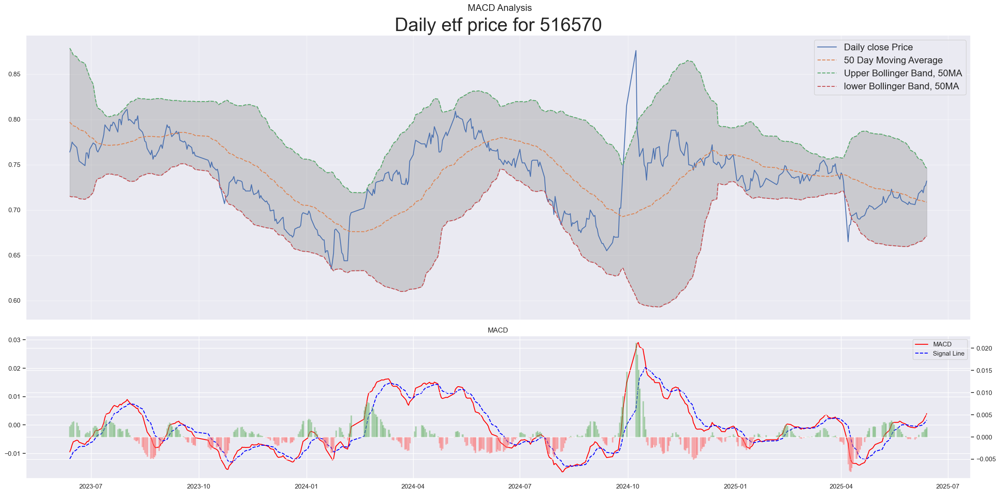

In [19]:
# 石油石化
etf_code = "516570"
etf_strategy(etf_code).output()

* Current etf price: 1.45
* Recent high: 1.56
* Current etf price is at 92.75999999999999% of recent high
Latest 20 Day MA: 1.42
Latest lower Bollinger Band, 20MA: 1.39
Latest higher Bollinger Band, 20MA: 1.46
Latest 50 Day MA: 1.38
Latest lower Bollinger Band, 50MA: 1.26
Latest higher Bollinger Band, 50MA: 1.5
Latest 50 Day EMA: 1.39
Latest 120 Day MA: 1.34
Latest 200 Day MA: 1.33
Latest 200 Day EMA: 1.33

Latest RSI: 65.42 
Latest MACD Divergence: 0.0 
20MA break point: 1.42
20MA lower Bollinger Band break point: 1.38
20MA Upper Bollinger Band break point: 1.47
50MA break point: 1.38
50MA lower Bollinger Band break point: 1.25
50MA Upper Bollinger Band break point: 1.51
120MA break point: 1.34
200MA break point: 1.33


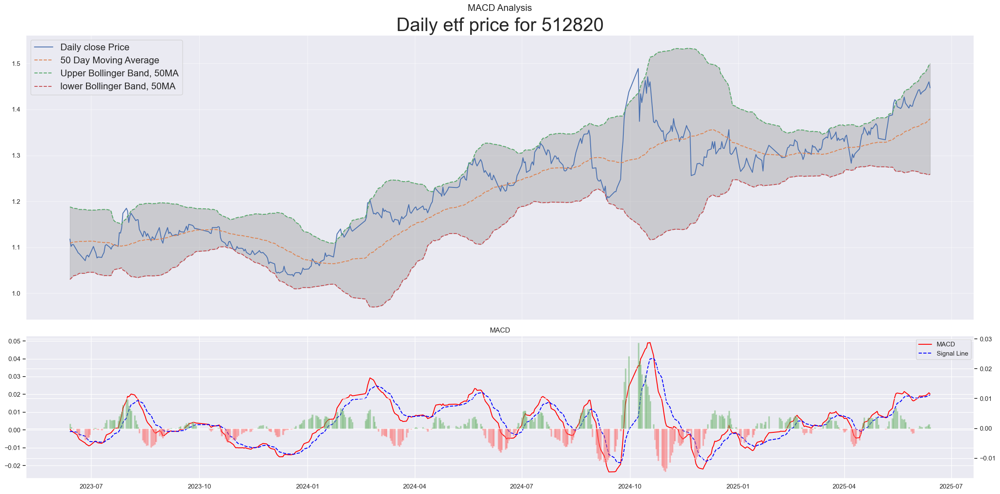

In [20]:
# 中证银行
etf_code = "512820"
etf_strategy(etf_code).output()

* Current etf price: 1.53
* Recent high: 1.76
* Current etf price is at 86.97% of recent high
Latest 20 Day MA: 1.53
Latest lower Bollinger Band, 20MA: 1.51
Latest higher Bollinger Band, 20MA: 1.56
Latest 50 Day MA: 1.53
Latest lower Bollinger Band, 50MA: 1.45
Latest higher Bollinger Band, 50MA: 1.6
Latest 50 Day EMA: 1.54
Latest 120 Day MA: 1.56
Latest 200 Day MA: 1.52
Latest 200 Day EMA: 1.53

Latest RSI: 59.18 
Latest MACD Divergence: 0.0 
20MA crosses 50MA at 1.24
20MA break point: 1.53
20MA lower Bollinger Band break point: 1.51
20MA Upper Bollinger Band break point: 1.56
50MA break point: 1.52
50MA lower Bollinger Band break point: 1.45
50MA Upper Bollinger Band break point: 1.6
120MA break point: 1.56
200MA break point: 1.53


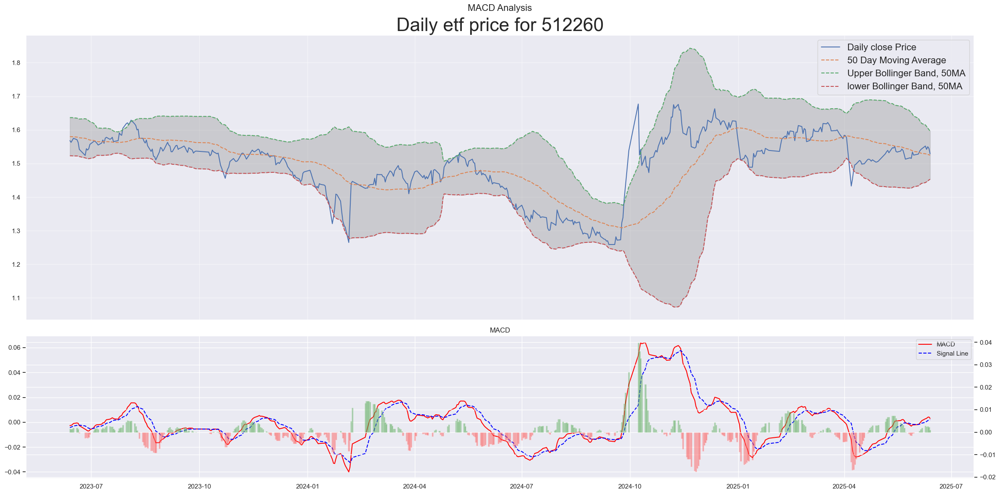

In [21]:
# 500低波
etf_code = "512260"
etf_strategy(etf_code).output()

* Current etf price: 0.99
* Recent high: 1.18
* Current etf price is at 84.00999999999999% of recent high
Latest 20 Day MA: 1.01
Latest lower Bollinger Band, 20MA: 0.99
Latest higher Bollinger Band, 20MA: 1.04
Latest 50 Day MA: 1.03
Latest lower Bollinger Band, 50MA: 0.96
Latest higher Bollinger Band, 50MA: 1.1
Latest 50 Day EMA: 1.03
Latest 120 Day MA: 1.04
Latest 200 Day MA: 0.97
Latest 200 Day EMA: 0.98

Latest RSI: 43.15 
Latest MACD Divergence: 0.0 
20MA crosses 50MA at 1.55
20MA break point: 1.01
20MA lower Bollinger Band break point: 0.98
20MA Upper Bollinger Band break point: 1.04
50MA break point: 1.03
50MA lower Bollinger Band break point: 0.95
50MA Upper Bollinger Band break point: 1.11
120MA break point: 1.04
200MA break point: 0.97


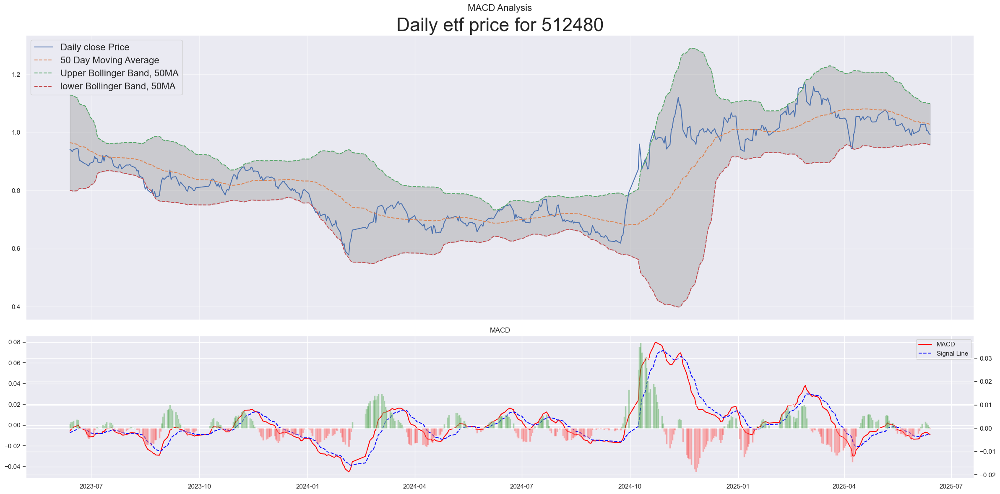

In [22]:
# 半导体
etf_code = "512480"
etf_strategy(etf_code).output()

* Current etf price: 0.91
* Recent high: 1.26
* Current etf price is at 71.67999999999999% of recent high
Latest 20 Day MA: 0.91
Latest lower Bollinger Band, 20MA: 0.89
Latest higher Bollinger Band, 20MA: 0.93
Latest 50 Day MA: 0.91
Latest lower Bollinger Band, 50MA: 0.84
Latest higher Bollinger Band, 50MA: 0.97
Latest 50 Day EMA: 0.92
Latest 120 Day MA: 0.94
Latest 200 Day MA: 0.95
Latest 200 Day EMA: 0.94

Latest RSI: 37.5 
Latest MACD Divergence: -0.0 
20MA crosses 50MA at 0.62
50MA crosses 200MA at 2.8
20MA break point: 0.91
20MA lower Bollinger Band break point: 0.89
20MA Upper Bollinger Band break point: 0.94
50MA break point: 0.9
50MA lower Bollinger Band break point: 0.84
50MA Upper Bollinger Band break point: 0.97
120MA break point: 0.94
200MA break point: 0.95


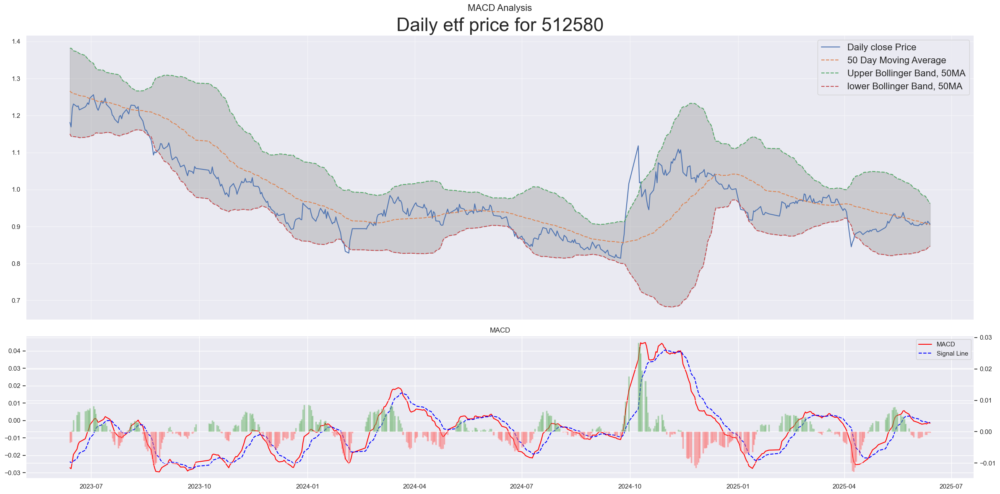

In [23]:
# 环保
etf_code = "512580"
etf_strategy(etf_code).output()

* Current etf price: 2.25
* Recent high: 3.02
* Current etf price is at 74.47% of recent high
Latest 20 Day MA: 2.23
Latest lower Bollinger Band, 20MA: 2.18
Latest higher Bollinger Band, 20MA: 2.28
Latest 50 Day MA: 2.19
Latest lower Bollinger Band, 50MA: 1.98
Latest higher Bollinger Band, 50MA: 2.39
Latest 50 Day EMA: 2.23
Latest 120 Day MA: 2.29
Latest 200 Day MA: 2.23
Latest 200 Day EMA: 2.22

Latest RSI: 55.02 
Latest MACD Divergence: 0.0 
20MA crosses 50MA at 0.73
50MA crosses 200MA at 2.93
20MA break point: 2.23
20MA lower Bollinger Band break point: 2.17
20MA Upper Bollinger Band break point: 2.29
50MA break point: 2.18
50MA lower Bollinger Band break point: 1.97
50MA Upper Bollinger Band break point: 2.4
120MA break point: 2.29
200MA break point: 2.24


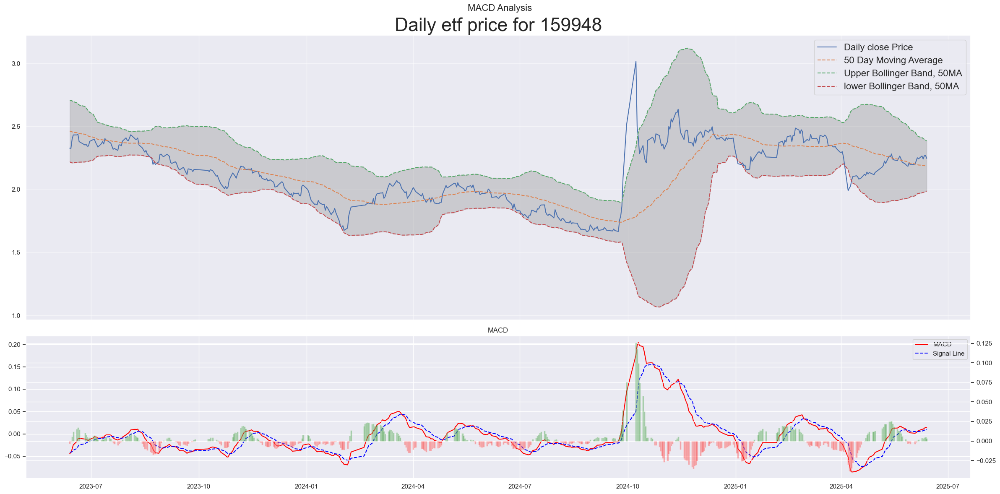

In [24]:
# 创业板
etf_code = "159948"
etf_strategy(etf_code).output()

* Current etf price: 0.91
* Recent high: 1.11
* Current etf price is at 82.22% of recent high
Latest 20 Day MA: 0.92
Latest lower Bollinger Band, 20MA: 0.89
Latest higher Bollinger Band, 20MA: 0.94
Latest 50 Day MA: 0.91
Latest lower Bollinger Band, 50MA: 0.83
Latest higher Bollinger Band, 50MA: 0.98
Latest 50 Day EMA: 0.92
Latest 120 Day MA: 0.94
Latest 200 Day MA: 0.88
Latest 200 Day EMA: 0.89

Latest RSI: 53.03 
Latest MACD Divergence: 0.0 
20MA crosses 50MA at 0.64
20MA break point: 0.92
20MA lower Bollinger Band break point: 0.88
20MA Upper Bollinger Band break point: 0.95
50MA break point: 0.91
50MA lower Bollinger Band break point: 0.83
50MA Upper Bollinger Band break point: 0.99
120MA break point: 0.94
200MA break point: 0.89


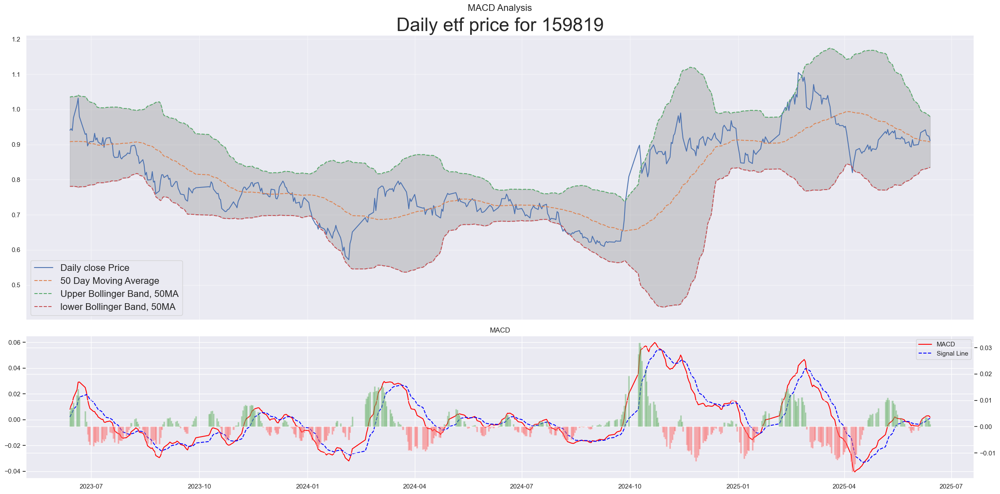

In [25]:
# 人工智能
etf_code = "159819"
etf_strategy(etf_code).output()

* Current etf price: 0.68
* Recent high: 0.89
* Current etf price is at 76.44% of recent high
Latest 20 Day MA: 0.7
Latest lower Bollinger Band, 20MA: 0.69
Latest higher Bollinger Band, 20MA: 0.7
Latest 50 Day MA: 0.7
Latest lower Bollinger Band, 50MA: 0.68
Latest higher Bollinger Band, 50MA: 0.71
Latest 50 Day EMA: 0.7
Latest 120 Day MA: 0.69
Latest 200 Day MA: 0.68
Latest 200 Day EMA: 0.69

Latest RSI: 40.62 
Latest MACD Divergence: -0.0 
20MA crosses 50MA at 0.78
20MA break point: 0.7
20MA lower Bollinger Band break point: 0.69
20MA Upper Bollinger Band break point: 0.7
50MA break point: 0.7
50MA lower Bollinger Band break point: 0.68
50MA Upper Bollinger Band break point: 0.72
120MA break point: 0.69
200MA break point: 0.68


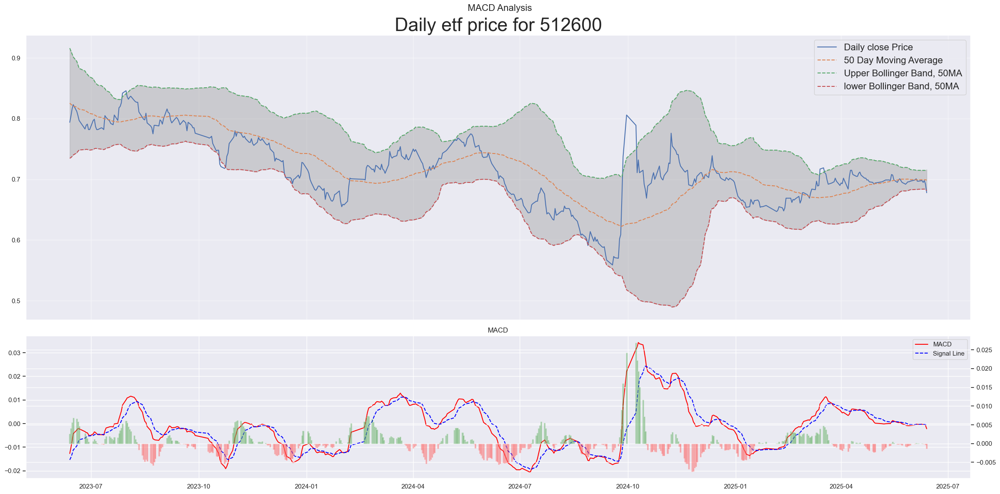

In [26]:
# 必选消费
etf_code = "512600"
etf_strategy(etf_code).output()

* Current etf price: 1.36
* Recent high: 1.51
* Current etf price is at 90.03999999999999% of recent high
Latest 20 Day MA: 1.4
Latest lower Bollinger Band, 20MA: 1.36
Latest higher Bollinger Band, 20MA: 1.43
Latest 50 Day MA: 1.38
Latest lower Bollinger Band, 50MA: 1.26
Latest higher Bollinger Band, 50MA: 1.5
Latest 50 Day EMA: 1.39
Latest 120 Day MA: 1.4
Latest 200 Day MA: 1.35
Latest 200 Day EMA: 1.35

Latest RSI: 31.13 
Latest MACD Divergence: -0.0 
20MA crosses 50MA at 0.66
20MA break point: 1.4
20MA lower Bollinger Band break point: 1.36
20MA Upper Bollinger Band break point: 1.44
50MA break point: 1.38
50MA lower Bollinger Band break point: 1.25
50MA Upper Bollinger Band break point: 1.5
120MA break point: 1.4
200MA break point: 1.35


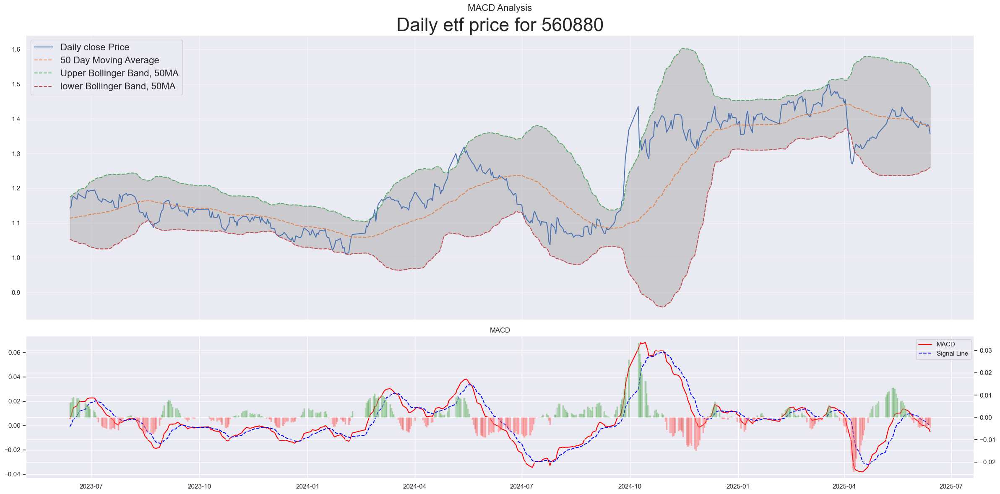

In [27]:
# 家电
etf_code = "560880"
etf_strategy(etf_code).output()

* Current etf price: 1.12
* Recent high: 1.23
* Current etf price is at 90.73% of recent high
Latest 20 Day MA: 1.07
Latest lower Bollinger Band, 20MA: 1.03
Latest higher Bollinger Band, 20MA: 1.11
Latest 50 Day MA: 1.05
Latest lower Bollinger Band, 50MA: 0.97
Latest higher Bollinger Band, 50MA: 1.13
Latest 50 Day EMA: 1.06
Latest 120 Day MA: 1.04
Latest 200 Day MA: 1.02
Latest 200 Day EMA: 1.04

Latest RSI: 70.94 
Latest MACD Divergence: 0.01 
20MA crosses 50MA at 0.49
20MA break point: 1.07
20MA lower Bollinger Band break point: 1.02
20MA Upper Bollinger Band break point: 1.11
50MA break point: 1.05
50MA lower Bollinger Band break point: 0.97
50MA Upper Bollinger Band break point: 1.13
120MA break point: 1.04
200MA break point: 1.03


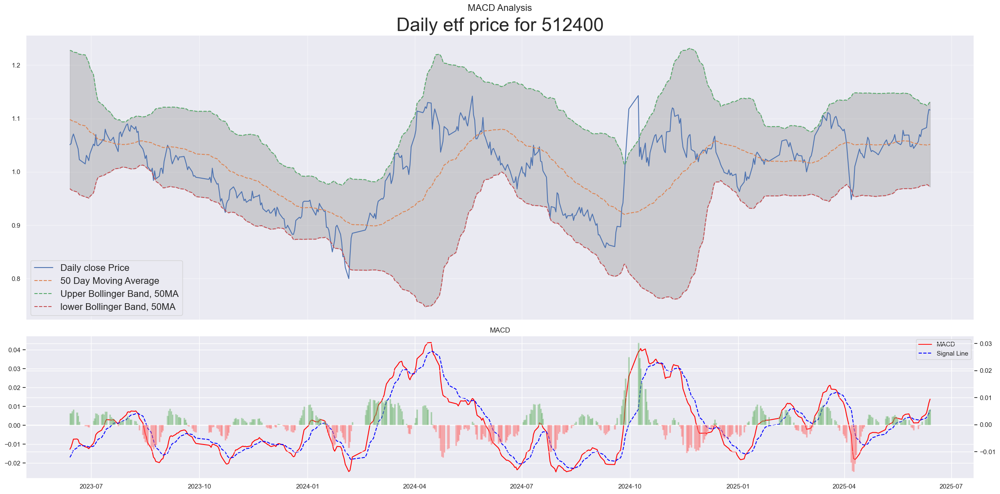

In [28]:
# 有色金属
etf_code = "512400"
etf_strategy(etf_code).output()

* Current etf price: 1.03
* Recent high: 1.2
* Current etf price is at 85.71% of recent high
Latest 20 Day MA: 0.97
Latest lower Bollinger Band, 20MA: 0.95
Latest higher Bollinger Band, 20MA: 1.0
Latest 50 Day MA: 0.96
Latest lower Bollinger Band, 50MA: 0.9
Latest higher Bollinger Band, 50MA: 1.02
Latest 50 Day EMA: 0.97
Latest 120 Day MA: 0.99
Latest 200 Day MA: 1.0
Latest 200 Day EMA: 0.99

Latest RSI: 80.0 
Latest MACD Divergence: 0.0 
20MA crosses 50MA at 0.51
50MA crosses 200MA at 2.21
20MA break point: 0.98
20MA lower Bollinger Band break point: 0.95
20MA Upper Bollinger Band break point: 1.0
50MA break point: 0.96
50MA lower Bollinger Band break point: 0.9
50MA Upper Bollinger Band break point: 1.02
120MA break point: 0.99
200MA break point: 1.0


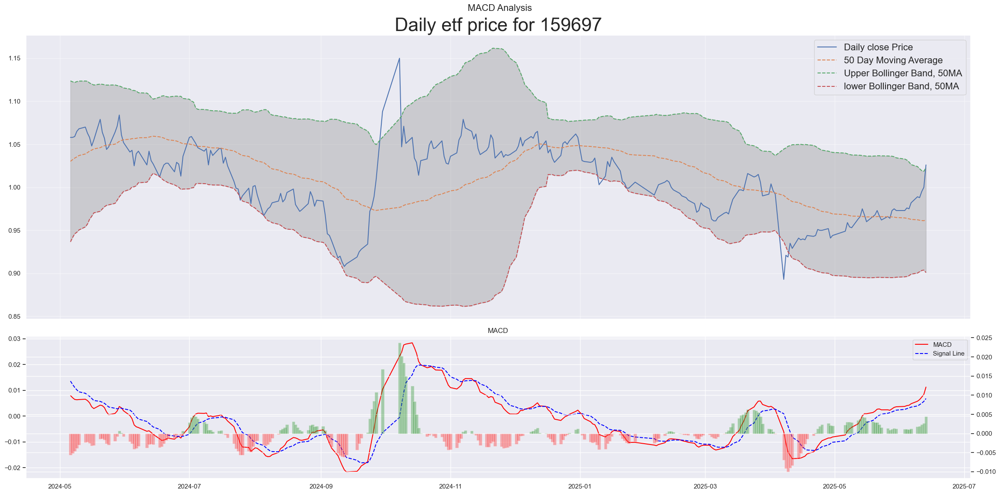

In [29]:
# 油气
etf_code = "159697"
etf_strategy(etf_code).output()

* Current etf price: 1.32
* Recent high: 1.53
* Current etf price is at 86.63% of recent high
Latest 20 Day MA: 1.26
Latest lower Bollinger Band, 20MA: 1.17
Latest higher Bollinger Band, 20MA: 1.34
Latest 50 Day MA: 1.21
Latest lower Bollinger Band, 50MA: 1.04
Latest higher Bollinger Band, 50MA: 1.38
Latest 50 Day EMA: 1.25
Latest 120 Day MA: 1.3
Latest 200 Day MA: 1.27
Latest 200 Day EMA: 1.25

Latest RSI: 69.58 
Latest MACD Divergence: 0.01 
50MA crosses 200MA at 4.1
20MA break point: 1.26
20MA lower Bollinger Band break point: 1.16
20MA Upper Bollinger Band break point: 1.35
50MA break point: 1.21
50MA lower Bollinger Band break point: 1.02
50MA Upper Bollinger Band break point: 1.39
120MA break point: 1.3
200MA break point: 1.28


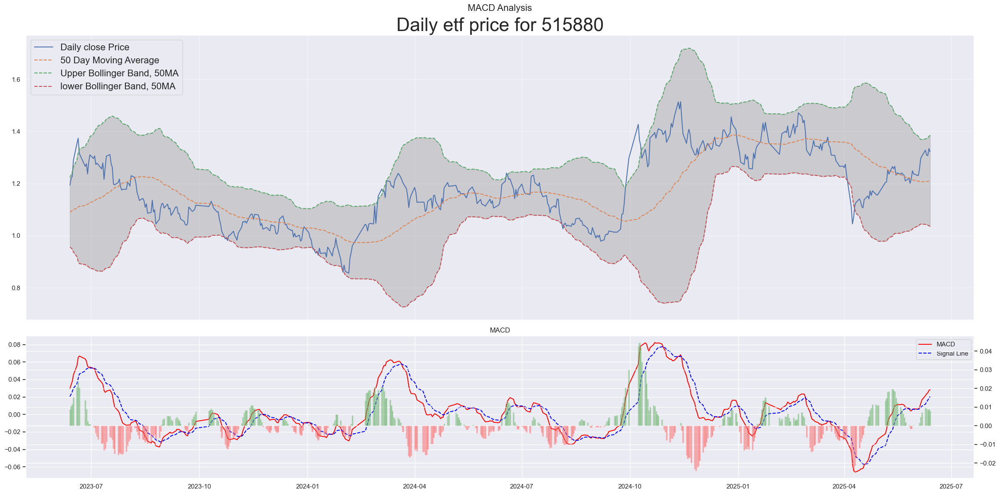

In [30]:
# 通信
etf_code = "515880"
etf_strategy(etf_code).output()

* Current etf price: 0.64
* Recent high: 0.68
* Current etf price is at 93.69% of recent high
Latest 20 Day MA: 0.61
Latest lower Bollinger Band, 20MA: 0.56
Latest higher Bollinger Band, 20MA: 0.65
Latest 50 Day MA: 0.58
Latest lower Bollinger Band, 50MA: 0.51
Latest higher Bollinger Band, 50MA: 0.65
Latest 50 Day EMA: 0.59
Latest 120 Day MA: 0.56
Latest 200 Day MA: 0.55
Latest 200 Day EMA: 0.56

Latest RSI: 74.14 
Latest MACD Divergence: 0.0 
20MA break point: 0.61
20MA lower Bollinger Band break point: 0.56
20MA Upper Bollinger Band break point: 0.66
50MA break point: 0.58
50MA lower Bollinger Band break point: 0.5
50MA Upper Bollinger Band break point: 0.66
120MA break point: 0.56
200MA break point: 0.55


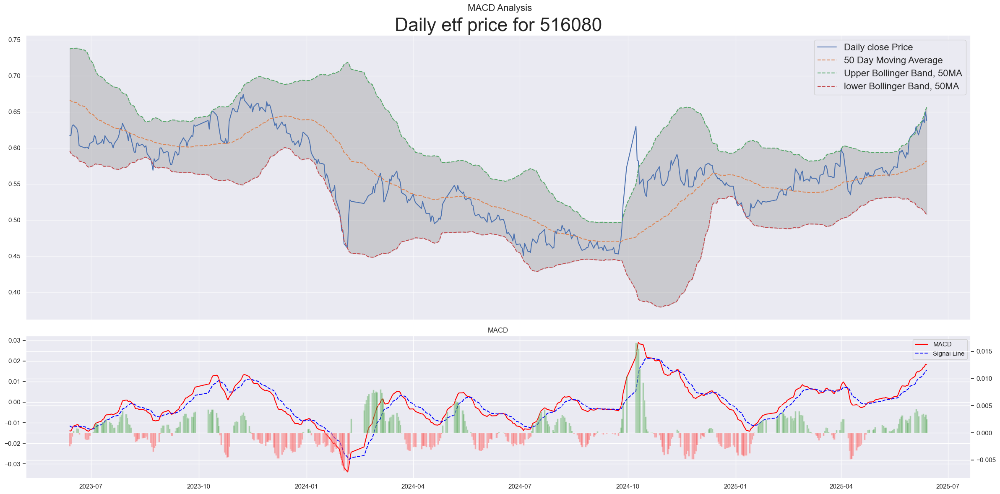

In [31]:
# 创新药
etf_code = "516080"
etf_strategy(etf_code).output()

* Current etf price: 0.98
* Recent high: 1.21
* Current etf price is at 81.74% of recent high
Latest 20 Day MA: 0.99
Latest lower Bollinger Band, 20MA: 0.96
Latest higher Bollinger Band, 20MA: 1.01
Latest 50 Day MA: 0.97
Latest lower Bollinger Band, 50MA: 0.92
Latest higher Bollinger Band, 50MA: 1.02
Latest 50 Day EMA: 0.98
Latest 120 Day MA: 0.98
Latest 200 Day MA: 0.98
Latest 200 Day EMA: 0.98

Latest RSI: 68.29 
Latest MACD Divergence: 0.0 
20MA crosses 50MA at 0.42
50MA crosses 200MA at 0.46
20MA break point: 0.99
20MA lower Bollinger Band break point: 0.96
20MA Upper Bollinger Band break point: 1.02
50MA break point: 0.97
50MA lower Bollinger Band break point: 0.92
50MA Upper Bollinger Band break point: 1.02
120MA break point: 0.98
200MA break point: 0.98


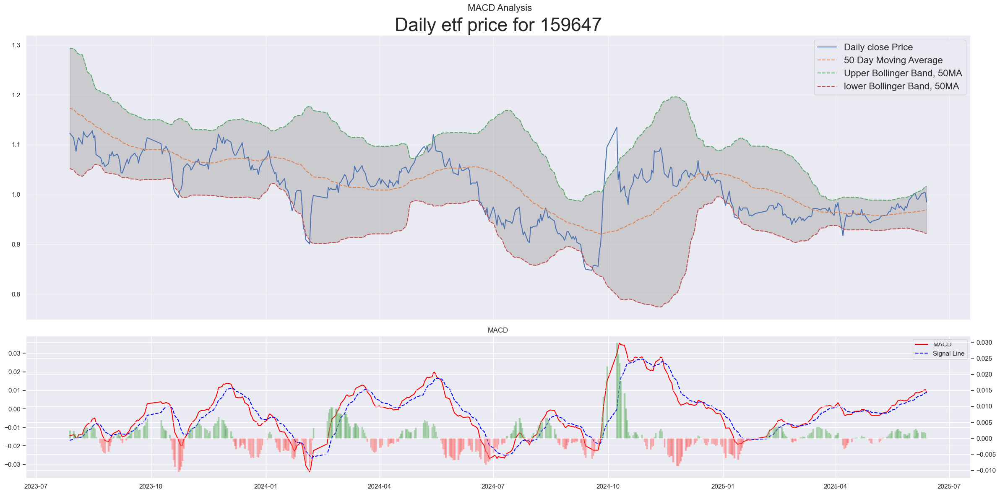

In [32]:
# 中药
etf_code = "159647"
etf_strategy(etf_code).output()

* Current etf price: 0.98
* Recent high: 2.77
* Current etf price is at 35.6% of recent high
Latest 20 Day MA: 0.99
Latest lower Bollinger Band, 20MA: 0.98
Latest higher Bollinger Band, 20MA: 1.0
Latest 50 Day MA: 0.99
Latest lower Bollinger Band, 50MA: 0.94
Latest higher Bollinger Band, 50MA: 1.03
Latest 50 Day EMA: 0.99
Latest 120 Day MA: 1.03
Latest 200 Day MA: 1.09
Latest 200 Day EMA: 1.14

Latest RSI: 41.94 
Latest MACD Divergence: 0.0 
20MA crosses 50MA at 0.86
50MA crosses 200MA at 6.11
20MA break point: 0.99
20MA lower Bollinger Band break point: 0.97
20MA Upper Bollinger Band break point: 1.01
50MA break point: 0.99
50MA lower Bollinger Band break point: 0.94
50MA Upper Bollinger Band break point: 1.03
120MA break point: 1.03
200MA break point: 1.08


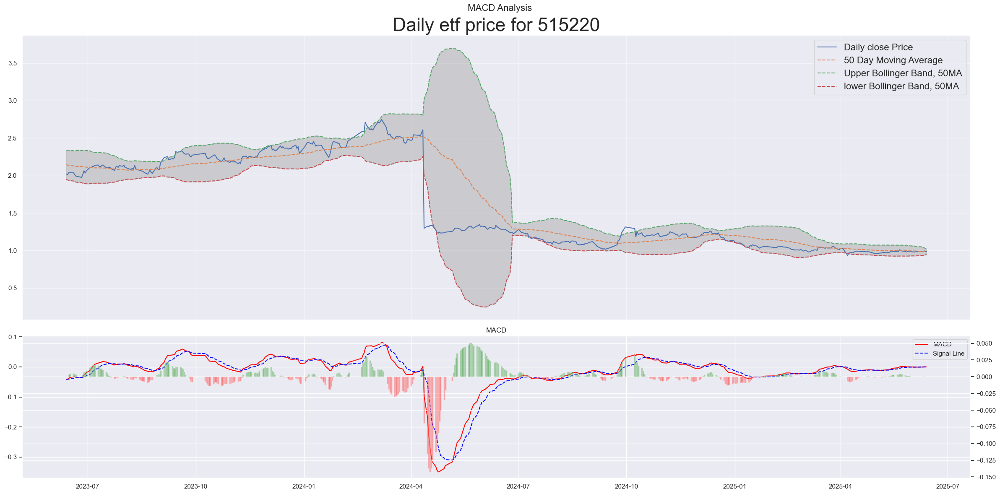

In [33]:
# 煤炭
etf_code = "515220"
etf_strategy(etf_code).output()

Could not retrieve real-time price for 512890. Using last available close price.
* Current etf price: 1.17
* Recent high: 1.24
* Current etf price is at 94.27% of recent high
Latest 20 Day MA: 1.16
Latest lower Bollinger Band, 20MA: 1.14
Latest higher Bollinger Band, 20MA: 1.18
Latest 50 Day MA: 1.13
Latest lower Bollinger Band, 50MA: 1.07
Latest higher Bollinger Band, 50MA: 1.2
Latest 50 Day EMA: 1.14
Latest 120 Day MA: 1.11
Latest 200 Day MA: 1.09
Latest 200 Day EMA: 1.09

Latest RSI: 65.57 
Latest MACD Divergence: -0.0 
20MA crosses 50MA at 0.3
20MA break point: 1.16
20MA lower Bollinger Band break point: 1.13
20MA Upper Bollinger Band break point: 1.19
50MA break point: 1.13
50MA lower Bollinger Band break point: 1.06
50MA Upper Bollinger Band break point: 1.21
120MA break point: 1.11
200MA break point: 1.09


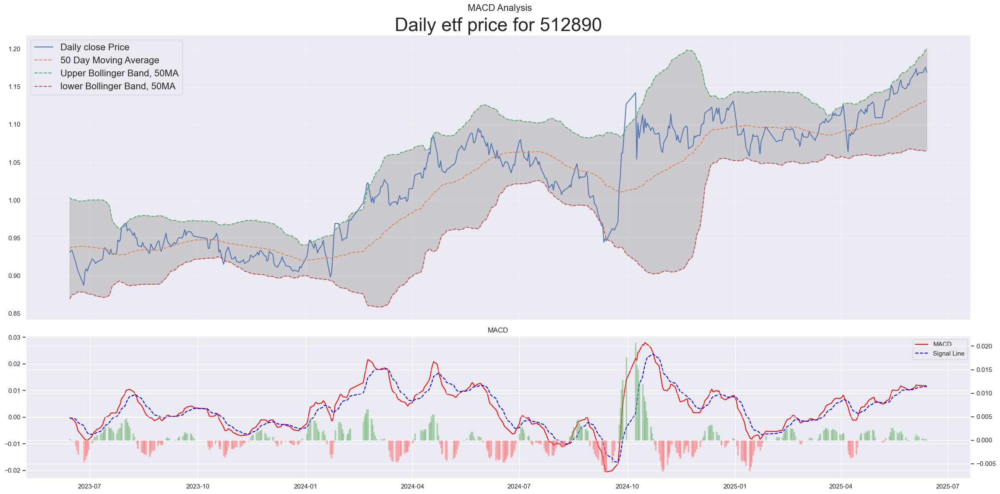

In [2]:
# 红利低波
etf_code = "512890"
etf_strategy(etf_code).output()

In [20]:
etf_code = "512890"
regression_start='20100101'
end=datetime.today().strftime('%Y%m%d')
detailed=False
adjust=""

df_etf = ak.fund_etf_hist_em(symbol=etf_code,
    	                   period="daily", 
                           start_date=regression_start,
                           end_date=end,
                           adjust=adjust)
df_etf.rename(columns={"日期": 'date', "开盘": 'open', "收盘": 'close', "最高": 'high', "最低": 'low', "成交量": 'volume', "成交额": 'amount'}, inplace=True)
df_etf['date'] = pd.to_datetime(df_etf['date'])
df_etf['max_price'] = df_etf['high'].cummax()
df_etf['drawdown'] = (df_etf['low'] - df_etf['max_price']) / df_etf['max_price']

max_drawdown_row = df_etf.loc[df_etf['drawdown'].idxmin()]
max_drawdown = max_drawdown_row['drawdown']

peak_date = df_etf.loc[:max_drawdown_row.name, 'high'].idxmax()
peak_price = round(df_etf.loc[peak_date, 'high'],2)
trough_date = max_drawdown_row['date']

df_etf = df_etf.reset_index()
df_etf['log_price'] = np.log(df_etf['close'])
df_etf

ConnectTimeout: HTTPSConnectionPool(host='push2his.eastmoney.com', port=443): Max retries exceeded with url: /api/qt/stock/kline/get?fields1=f1%2Cf2%2Cf3%2Cf4%2Cf5%2Cf6&fields2=f51%2Cf52%2Cf53%2Cf54%2Cf55%2Cf56%2Cf57%2Cf58%2Cf59%2Cf60%2Cf61%2Cf116&ut=7eea3edcaed734bea9cbfc24409ed989&klt=101&fqt=0&beg=20100101&end=20250614&_=1623766962675&secid=1.512890 (Caused by ConnectTimeoutError(<urllib3.connection.HTTPSConnection object at 0x17f56b650>, 'Connection to push2his.eastmoney.com timed out. (connect timeout=15)'))

Annual expected return rate: -3.81%
Maximal Drawdown: -59.62%
Peak date: 651 with price 1.8
Trough date: 2021-11-10 with price 0.73
Final price extracted: 0.95
R2: 0.1168
Maximal Drawdown from regression price relative to regression price: 32.41%


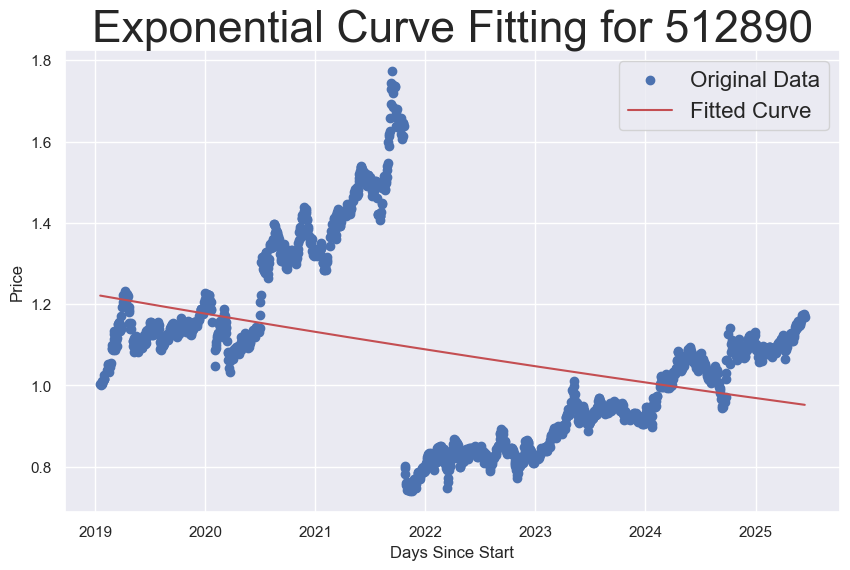

Annual expected return rate: -5.51%
Maximal Drawdown: -59.62%
Peak date: 419 with price 1.8
Trough date: 2021-11-10 with price 0.73
Final price extracted: 0.92
R2: 0.1097
Maximal Drawdown from regression price relative to regression price: 34.05%


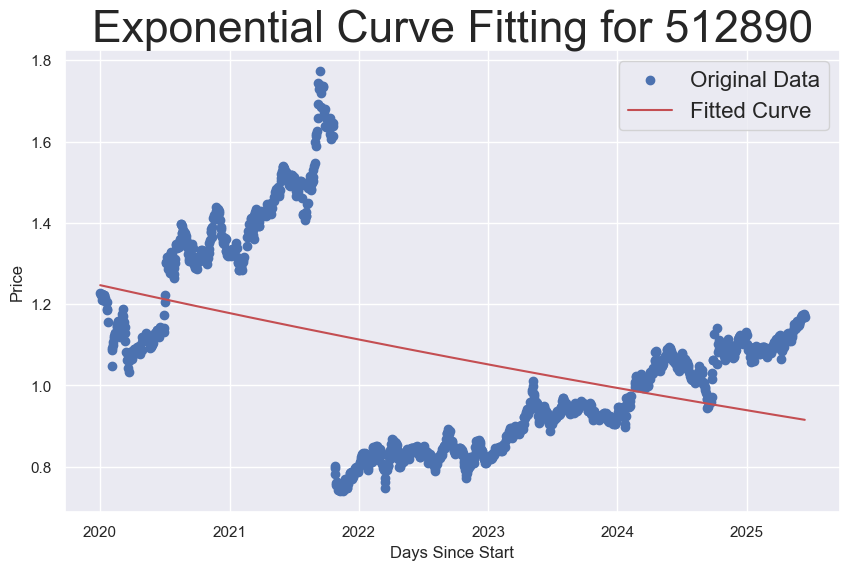

Annual expected return rate: -5.92%
Maximal Drawdown: -59.62%
Peak date: 369 with price 1.8
Trough date: 2021-11-10 with price 0.73
Final price extracted: 0.91
R2: 0.1
Maximal Drawdown from regression price relative to regression price: 34.49%


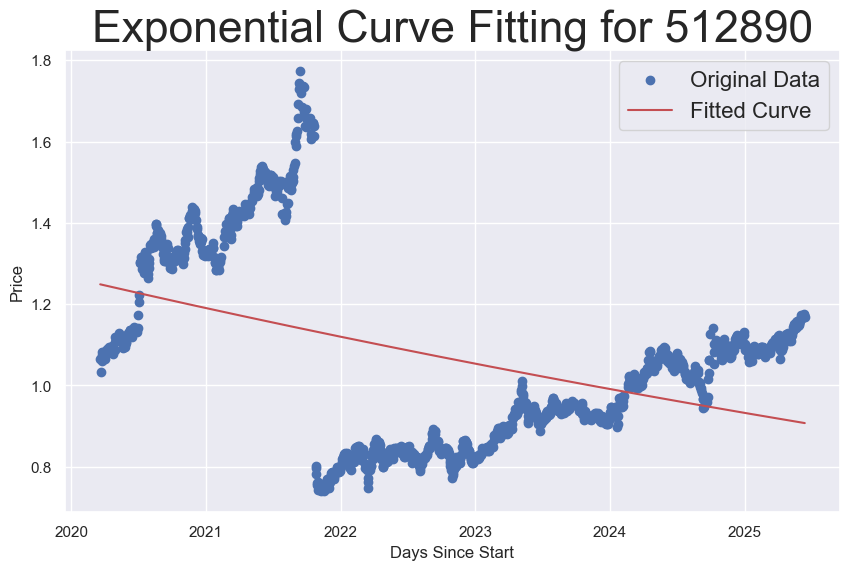

0.91

In [3]:
etf_code = "512890"
etf_regression(etf_code, detailed=True) # bad
etf_regression(etf_code, regression_start='20200101', detailed=True) # bad
etf_regression(etf_code, regression_start='20200320', detailed=True) # bad

* Current etf price: 1.36
* Recent high: 1.62
* Current etf price is at 84.25% of recent high
Latest 20 Day MA: 1.36
Latest lower Bollinger Band, 20MA: 1.35
Latest higher Bollinger Band, 20MA: 1.38
Latest 50 Day MA: 1.35
Latest lower Bollinger Band, 50MA: 1.29
Latest higher Bollinger Band, 50MA: 1.4
Latest 50 Day EMA: 1.35
Latest 120 Day MA: 1.34
Latest 200 Day MA: 1.34
Latest 200 Day EMA: 1.34

Latest RSI: 47.37 
Latest MACD Divergence: 0.0 
20MA crosses 50MA at 0.8
20MA break point: 1.36
20MA lower Bollinger Band break point: 1.35
20MA Upper Bollinger Band break point: 1.38
50MA break point: 1.35
50MA lower Bollinger Band break point: 1.29
50MA Upper Bollinger Band break point: 1.4
120MA break point: 1.34
200MA break point: 1.34


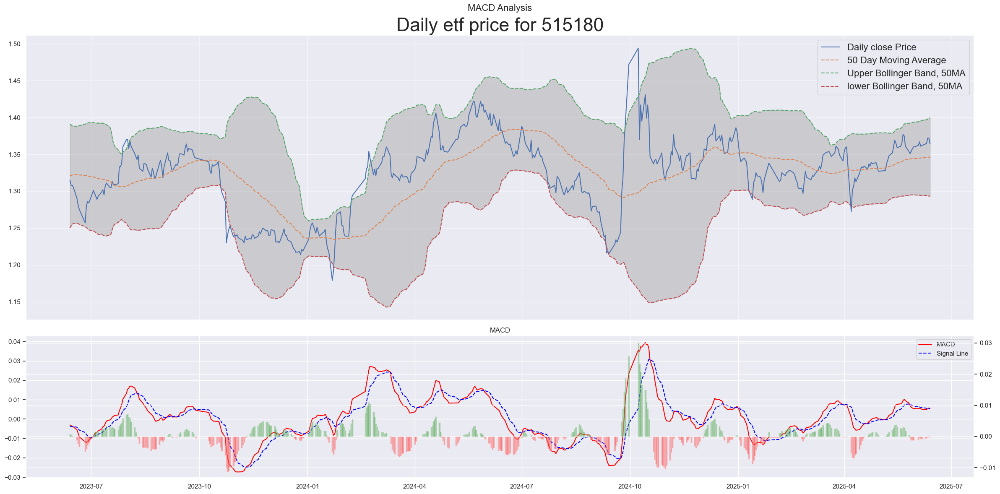

In [35]:
# 红利
etf_code = "515180"
etf_strategy(etf_code).output()

* Current commodity price: 239    761.5
Name: 现价, dtype: float64
* Recent high: 834.6
* Current commodity price is at 239    91.24
Name: 现价, dtype: float64% of recent high
Latest 20 Day MA: 771.93
Latest lower Bollinger Band, 20MA: 750.37
Latest higher Bollinger Band, 20MA: 793.48
Latest 50 Day MA: 768.61
Latest lower Bollinger Band, 50MA: 711.52
Latest higher Bollinger Band, 50MA: 825.69
Latest 50 Day EMA: 759.5
Latest 120 Day MA: 705.1
Latest 200 Day MA: 662.54
Latest 200 Day EMA: 676.74

Latest RSI: 62.6 
Latest MACD Divergence: 0.89 
20MA crosses 50MA at 756.53
20MA break point: 777.62
20MA lower Bollinger Band break point: 762.16
20MA Upper Bollinger Band break point: 793.07
50MA break point: 776.97
50MA lower Bollinger Band break point: 737.15
50MA Upper Bollinger Band break point: 816.79
120MA break point: 719.12
200MA break point: 675.92


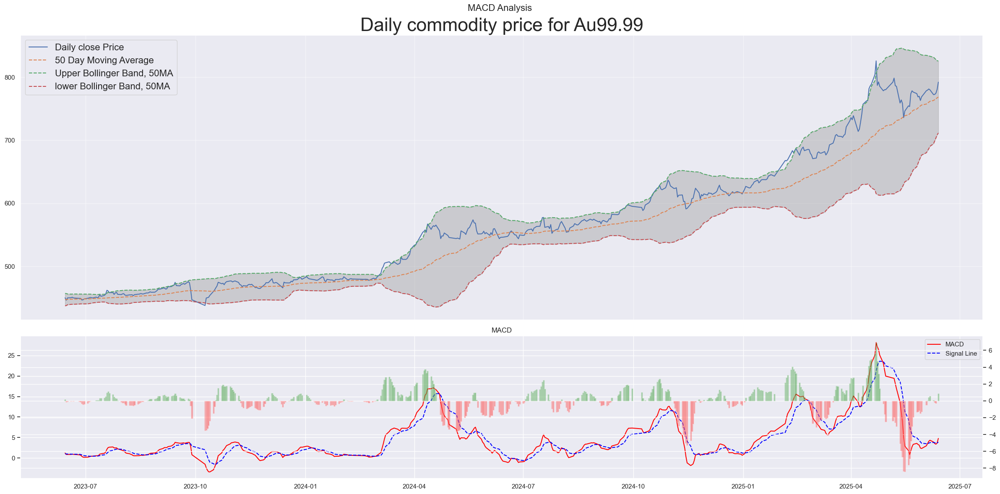

In [23]:
# 黄金
commodity_code = 'Au99.99'
commodity_strategy(commodity_code).output()

* Current etf price: 0.82
* Recent high: 1.03
* Current etf price is at 79.52% of recent high
Latest 20 Day MA: 0.81
Latest lower Bollinger Band, 20MA: 0.78
Latest higher Bollinger Band, 20MA: 0.84
Latest 50 Day MA: 0.8
Latest lower Bollinger Band, 50MA: 0.74
Latest higher Bollinger Band, 50MA: 0.85
Latest 50 Day EMA: 0.81
Latest 120 Day MA: 0.81
Latest 200 Day MA: 0.77
Latest 200 Day EMA: 0.78

Latest RSI: 66.39 
Latest MACD Divergence: 0.0 
20MA crosses 50MA at 0.41
20MA break point: 0.81
20MA lower Bollinger Band break point: 0.77
20MA Upper Bollinger Band break point: 0.84
50MA break point: 0.8
50MA lower Bollinger Band break point: 0.74
50MA Upper Bollinger Band break point: 0.86
120MA break point: 0.81
200MA break point: 0.77


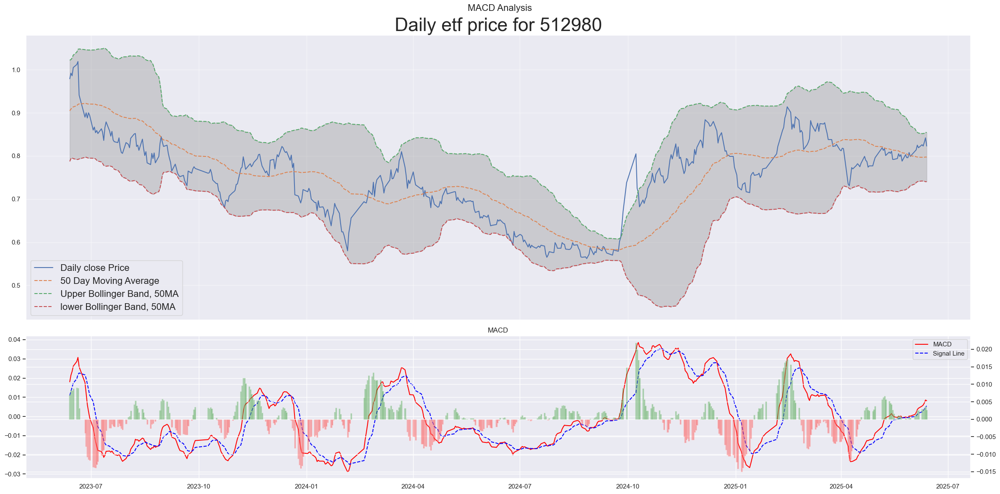

In [37]:
# 传媒
etf_code = "512980"
etf_strategy(etf_code).output()

* Current etf price: 1.2
* Recent high: 1.3
* Current etf price is at 91.99000000000001% of recent high
Latest 20 Day MA: 1.18
Latest lower Bollinger Band, 20MA: 1.15
Latest higher Bollinger Band, 20MA: 1.21
Latest 50 Day MA: 1.15
Latest lower Bollinger Band, 50MA: 1.07
Latest higher Bollinger Band, 50MA: 1.23
Latest 50 Day EMA: 1.16
Latest 120 Day MA: 1.15
Latest 200 Day MA: 1.12
Latest 200 Day EMA: 1.11

Latest RSI: 66.67 
Latest MACD Divergence: 0.0 
20MA crosses 50MA at 0.27
20MA break point: 1.18
20MA lower Bollinger Band break point: 1.15
20MA Upper Bollinger Band break point: 1.21
50MA break point: 1.15
50MA lower Bollinger Band break point: 1.06
50MA Upper Bollinger Band break point: 1.24
120MA break point: 1.15
200MA break point: 1.12


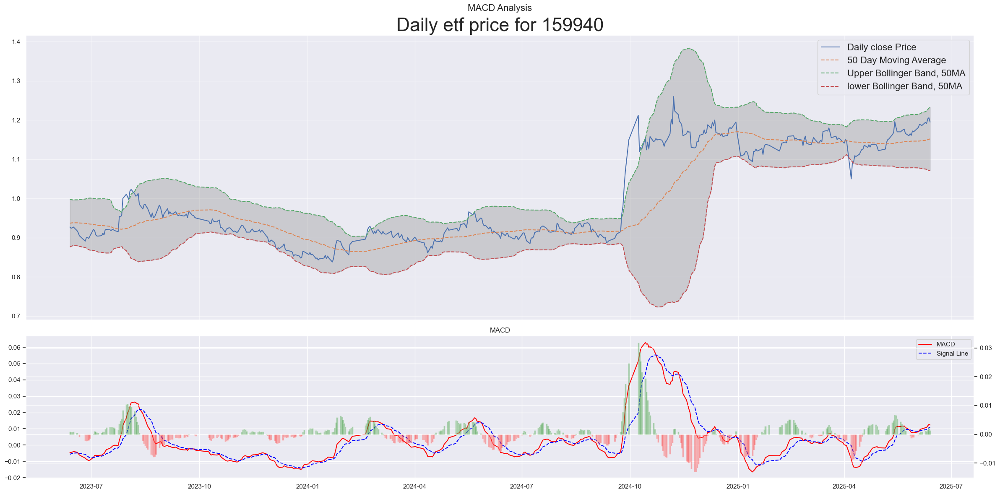

In [38]:
# 地产
etf_code = "159940"
etf_strategy(etf_code).output()

* Current etf price: 1.28
* Recent high: 1.42
* Current etf price is at 90.16% of recent high
Latest 20 Day MA: 1.31
Latest lower Bollinger Band, 20MA: 1.26
Latest higher Bollinger Band, 20MA: 1.36
Latest 50 Day MA: 1.28
Latest lower Bollinger Band, 50MA: 1.17
Latest higher Bollinger Band, 50MA: 1.39
Latest 50 Day EMA: 1.29
Latest 120 Day MA: 1.29
Latest 200 Day MA: 1.23
Latest 200 Day EMA: 1.24

Latest RSI: 39.38 
Latest MACD Divergence: -0.0 
20MA crosses 50MA at 0.41
20MA break point: 1.31
20MA lower Bollinger Band break point: 1.25
20MA Upper Bollinger Band break point: 1.36
50MA break point: 1.28
50MA lower Bollinger Band break point: 1.16
50MA Upper Bollinger Band break point: 1.4
120MA break point: 1.29
200MA break point: 1.24


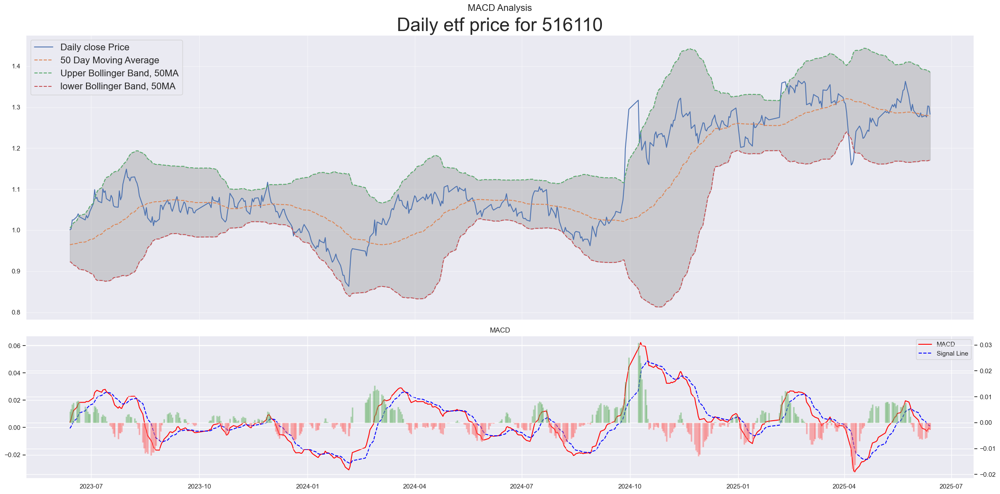

In [41]:
# 汽车
etf_code = "516110"
etf_strategy(etf_code).output()

* Current etf price: 1.34
* Recent high: 1.63
* Current etf price is at 82.67% of recent high
Latest 20 Day MA: 1.36
Latest lower Bollinger Band, 20MA: 1.32
Latest higher Bollinger Band, 20MA: 1.41
Latest 50 Day MA: 1.35
Latest lower Bollinger Band, 50MA: 1.22
Latest higher Bollinger Band, 50MA: 1.47
Latest 50 Day EMA: 1.36
Latest 120 Day MA: 1.34
Latest 200 Day MA: 1.23
Latest 200 Day EMA: 1.26

Latest RSI: 55.0 
Latest MACD Divergence: 0.01 
20MA crosses 50MA at 0.76
20MA break point: 1.36
20MA lower Bollinger Band break point: 1.31
20MA Upper Bollinger Band break point: 1.41
50MA break point: 1.34
50MA lower Bollinger Band break point: 1.21
50MA Upper Bollinger Band break point: 1.47
120MA break point: 1.34
200MA break point: 1.24


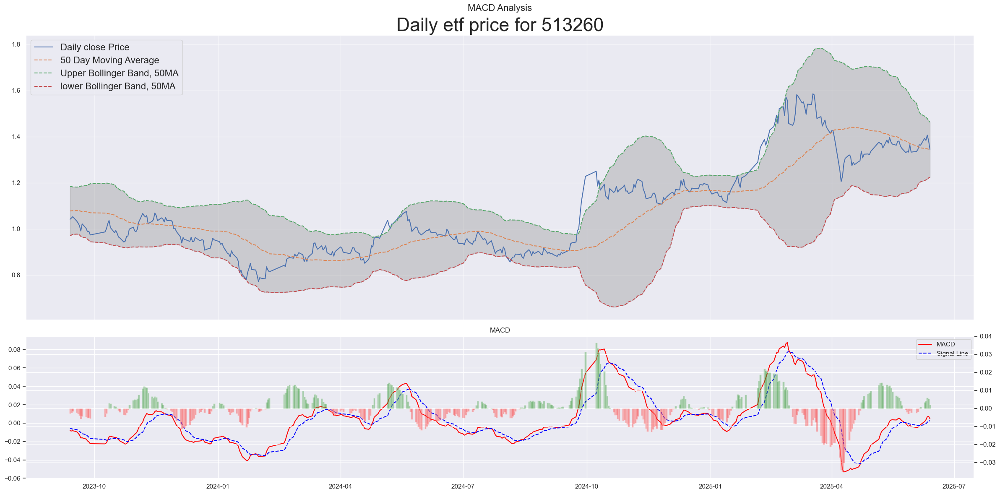

In [42]:
# 恒生科技
etf_code = "513260"
etf_strategy(etf_code).output()

* Current etf price: 0.58
* Recent high: 0.61
* Current etf price is at 95.89% of recent high
Latest 20 Day MA: 0.52
Latest lower Bollinger Band, 20MA: 0.45
Latest higher Bollinger Band, 20MA: 0.59
Latest 50 Day MA: 0.49
Latest lower Bollinger Band, 50MA: 0.39
Latest higher Bollinger Band, 50MA: 0.59
Latest 50 Day EMA: 0.5
Latest 120 Day MA: 0.45
Latest 200 Day MA: 0.42
Latest 200 Day EMA: 0.44

Latest RSI: 85.51 
Latest MACD Divergence: 0.01 
20MA break point: 0.52
20MA lower Bollinger Band break point: 0.45
20MA Upper Bollinger Band break point: 0.6
50MA break point: 0.49
50MA lower Bollinger Band break point: 0.38
50MA Upper Bollinger Band break point: 0.59
120MA break point: 0.45
200MA break point: 0.42


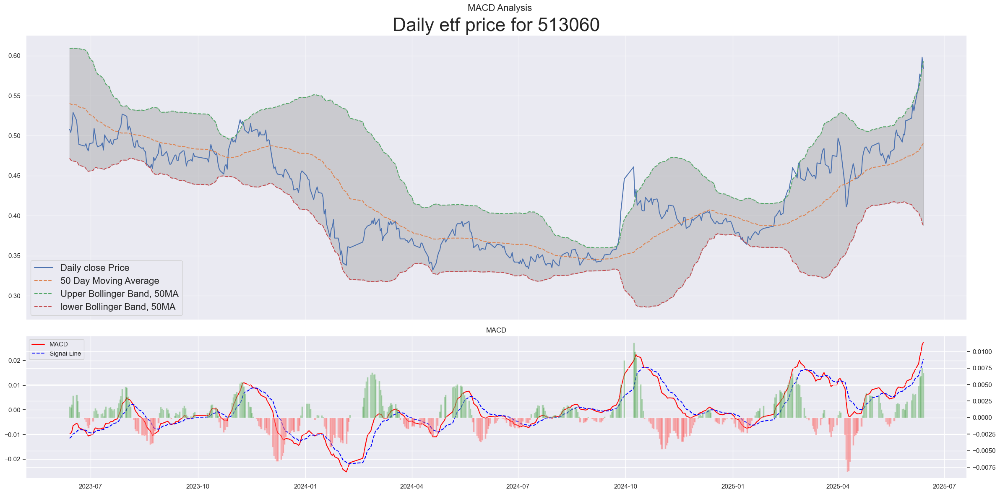

In [43]:
# 恒生医疗
etf_code = "513060"
etf_strategy(etf_code).output()

* Current etf price: 2.92
* Recent high: 3.07
* Current etf price is at 95.28% of recent high
Latest 20 Day MA: 2.91
Latest lower Bollinger Band, 20MA: 2.82
Latest higher Bollinger Band, 20MA: 2.99
Latest 50 Day MA: 2.81
Latest lower Bollinger Band, 50MA: 2.5
Latest higher Bollinger Band, 50MA: 3.11
Latest 50 Day EMA: 2.85
Latest 120 Day MA: 2.72
Latest 200 Day MA: 2.56
Latest 200 Day EMA: 2.61

Latest RSI: 60.8 
Latest MACD Divergence: 0.01 
20MA break point: 2.91
20MA lower Bollinger Band break point: 2.81
20MA Upper Bollinger Band break point: 3.01
50MA break point: 2.81
50MA lower Bollinger Band break point: 2.48
50MA Upper Bollinger Band break point: 3.14
120MA break point: 2.72
200MA break point: 2.57


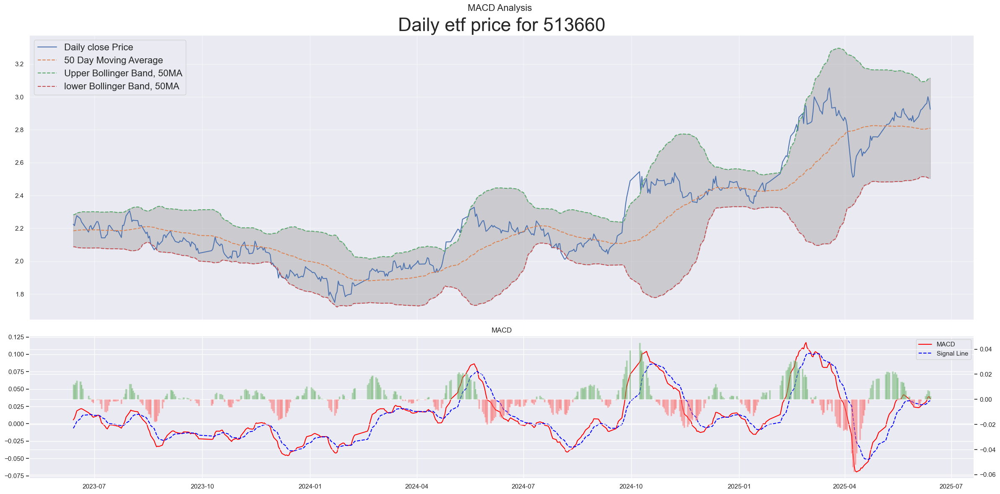

In [44]:
# 恒生
etf_code = "513660"
etf_strategy(etf_code).output()

* Current etf price: 1.37
* Recent high: 1.37
* Current etf price is at 100.0% of recent high
Latest 20 Day MA: 1.31
Latest lower Bollinger Band, 20MA: 1.27
Latest higher Bollinger Band, 20MA: 1.35
Latest 50 Day MA: 1.27
Latest lower Bollinger Band, 50MA: 1.15
Latest higher Bollinger Band, 50MA: 1.38
Latest 50 Day EMA: 1.28
Latest 120 Day MA: 1.24
Latest 200 Day MA: 1.2
Latest 200 Day EMA: 1.2

Latest RSI: 87.84 
Latest MACD Divergence: 0.0 
20MA break point: 1.31
20MA lower Bollinger Band break point: 1.26
20MA Upper Bollinger Band break point: 1.36
50MA break point: 1.27
50MA lower Bollinger Band break point: 1.14
50MA Upper Bollinger Band break point: 1.4
120MA break point: 1.24
200MA break point: 1.2


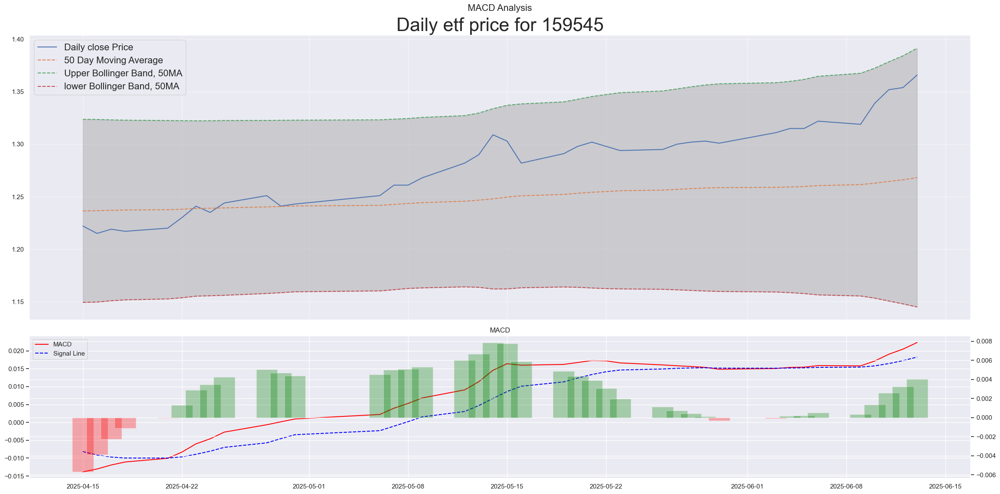

In [45]:
# 恒生红利低波
etf_code = "159545"
etf_strategy(etf_code).output()

* Current etf price: 2.75
* Recent high: 3.2
* Current etf price is at 85.81% of recent high
Latest 20 Day MA: 2.76
Latest lower Bollinger Band, 20MA: 2.73
Latest higher Bollinger Band, 20MA: 2.8
Latest 50 Day MA: 2.73
Latest lower Bollinger Band, 50MA: 2.62
Latest higher Bollinger Band, 50MA: 2.84
Latest 50 Day EMA: 2.74
Latest 120 Day MA: 2.71
Latest 200 Day MA: 2.68
Latest 200 Day EMA: 2.68

Latest RSI: 33.33 
Latest MACD Divergence: -0.0 
20MA crosses 50MA at 1.75
20MA break point: 2.76
20MA lower Bollinger Band break point: 2.73
20MA Upper Bollinger Band break point: 2.8
50MA break point: 2.73
50MA lower Bollinger Band break point: 2.61
50MA Upper Bollinger Band break point: 2.85
120MA break point: 2.71
200MA break point: 2.69


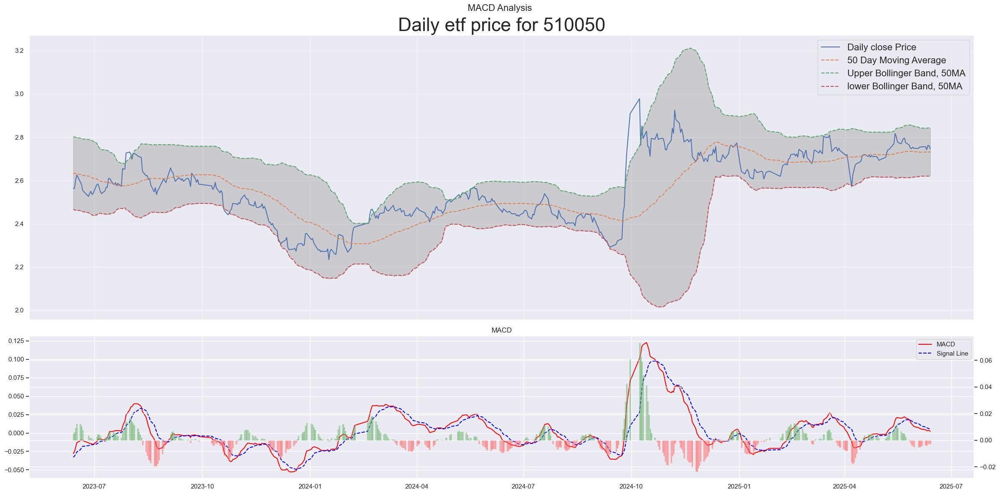

In [47]:
# 上证50
etf_code = "510050"
etf_strategy(etf_code).output()